<a href="https://colab.research.google.com/github/Hamza-Faarooq/Stock-Price-Prediction/blob/main/Stock_Price_Prediction_With_LSTM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install keras_tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 2.4 MB/s eta 0:00:00


#  **IMPORTING LIBRARIES**

In [ ]:
from google.colab import drive
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.model_selection import train_test_split
import joblib

In [ ]:
import keras_tuner as kt
import tensorflow as tf

In [ ]:
drive.mount('/content/drive')
data_path = "/content/World-Stock-Prices-Dataset.csv"

Mounted at /content/drive


# **IMPORTING CSV DATASET**

In [ ]:
data = pd.read_csv(data_path, low_memory=False)

In [ ]:
# Reduce memory usage
for col in data.select_dtypes(include=['float64']).columns:
    data[col] = data[col].astype('float32')
for col in data.select_dtypes(include=['int64']).columns:
    data[col] = data[col].astype('int32')

# Display first few rows
data.head()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits,Brand_Name,Ticker,Industry_Tag,Country,Capital Gains
0,2025-02-28 00:00:00-05:00,7.410000,7.670000,7.380000,7.530000,12524600.0,0.0,0.0,peloton,PTON,fitness,usa,NaN
1,2025-02-28 00:00:00-05:00,179.690002,181.529999,179.119995,181.479996,363400.0,0.0,0.0,toyota,TM,automotive,japan,NaN
2,2025-02-28 00:00:00-05:00,126.589996,128.229996,125.760002,127.589996,34800.0,0.0,0.0,adidas,ADDYY,apparel,germany,NaN
3,2025-02-28 00:00:00-05:00,296.290009,301.070007,294.970001,300.959991,3335700.0,0.0,0.0,american express,AXP,finance,usa,NaN
4,2025-02-28 00:00:00-05:00,30.540001,30.540001,29.804001,29.804001,100.0,0.0,0.0,puma,PMMAF,apparel,germany,NaN


# **ANALYSING THE DATASET**

In [ ]:
# Check for missing values
print(data.isnull().sum())

Date                  0
Open                  0
High                  0
Low                   0
Close                 0
Volume                0
Dividends             0
Stock Splits          0
Brand_Name            0
Ticker                0
Industry_Tag          0
Country               0
Capital Gains    304178
dtype: int64


In [ ]:
# Basic statistics of numerical columns
print(data.describe())

                Open           High            Low          Close  \
count  304180.000000  304180.000000  304180.000000  304180.000000   
mean       74.306892      75.147156      73.445076      74.313911   
std       139.270660     140.759445     137.678772     139.249023   
min         0.196890       0.199922       0.192798       0.198861   
25%        15.757520      15.975996      15.538082      15.760843   
50%        34.803623      35.217739      34.383011      34.815657   
75%        81.161633      81.987053      80.339516      81.190002   
max      3445.580078    3463.070068    3370.000000    3427.610107   

             Volume      Dividends   Stock Splits  Capital Gains  
count  3.041800e+05  304180.000000  304180.000000            2.0  
mean   2.284758e+07       0.003609       0.000892            0.0  
std    8.631430e+07       0.069582       0.116553            0.0  
min    0.000000e+00       0.000000       0.000000            0.0  
25%    1.367700e+06       0.000000       0.

# **EXPLORATORY DATA ANALYSIS (EDA)**

In [ ]:
# Group by 'Ticker' and plot each brand's stock prices
fig = go.Figure()

for ticker in data['Ticker'].unique():
    # Filter data for each brand (Ticker)
    brand_data = data[data['Ticker'] == ticker]

    # Add a trace for each brand
    fig.add_trace(go.Scatter(
        x=brand_data['Date'],
        y=brand_data['Close'],
        mode='lines',
        name=ticker,
        opacity=0.7
    ))

# Update layout for better visualization
fig.update_layout(
    title="Stock Price Trends of World's Most Famous Brands",
    xaxis_title="Date",
    yaxis_title="Closing Price ($)",
    xaxis=dict(tickangle=45),
    legend=dict(
        x=1.05, y=1, traceorder='normal',
        font=dict(size=10), orientation='v'
    ),
    margin=dict(l=0, r=0, t=30, b=0),
    hovermode='x',
    template='plotly_dark'
)

# Show the plot
fig.show()

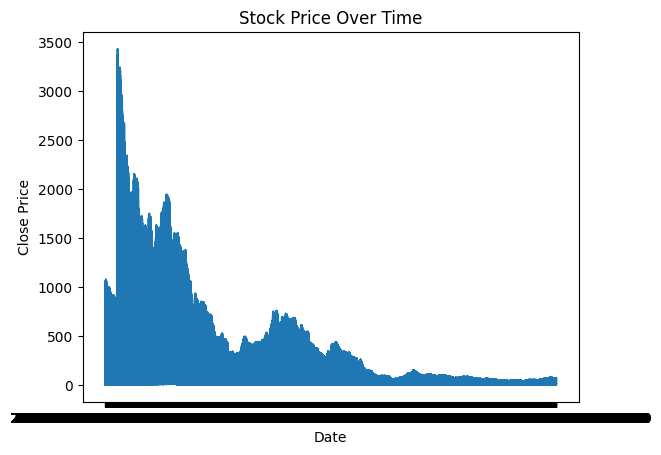

In [ ]:
plt.plot(data['Date'], data['Close'])
plt.title('Stock Price Over Time')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.show()

In [ ]:
# Group data by Brand_Name
grouped_data = data.groupby('Brand_Name')

In [ ]:
# Counting the number of unique brands
unique_brands_count = data['Brand_Name'].nunique()
print(f"Number of unique brands: {unique_brands_count}")

Number of unique brands: 61


In [ ]:
data.drop(columns=['Capital Gains'], inplace=True)

In [ ]:
# Calculate average closing price and volatility (standard deviation) for each brand
brand_metrics = data.groupby('Brand_Name').agg({
    'Close': ['mean', 'std'],  # Mean and standard deviation of Close prices
    'Volume': ['mean']         # Average trading volume
}).reset_index()

# Rename columns for clarity
brand_metrics.columns = ['Brand_Name', 'Avg_Close', 'Volatility', 'Avg_Volume']
print(brand_metrics)

                   Brand_Name   Avg_Close  Volatility    Avg_Volume
0                          3m   86.908569   48.839291  3.477705e+06
1                      adidas   70.425278   47.526779  5.971316e+04
2                       adobe  151.488068  182.577408  5.130251e+06
3                      airbnb  139.678925   25.241198  6.042312e+06
4                      amazon   45.938221   60.933620  1.175028e+08
..                        ...         ...         ...           ...
56                    ubisoft    7.660504    5.997250  6.444126e+04
57                   unilever   28.499193   16.678886  1.222464e+06
58                       visa  113.344971   90.576080  1.432309e+07
59  zoom video communications  149.667770  120.351845  4.810370e+06
60                   zoominfo   33.000626   18.166088  4.968960e+06

[61 rows x 4 columns]


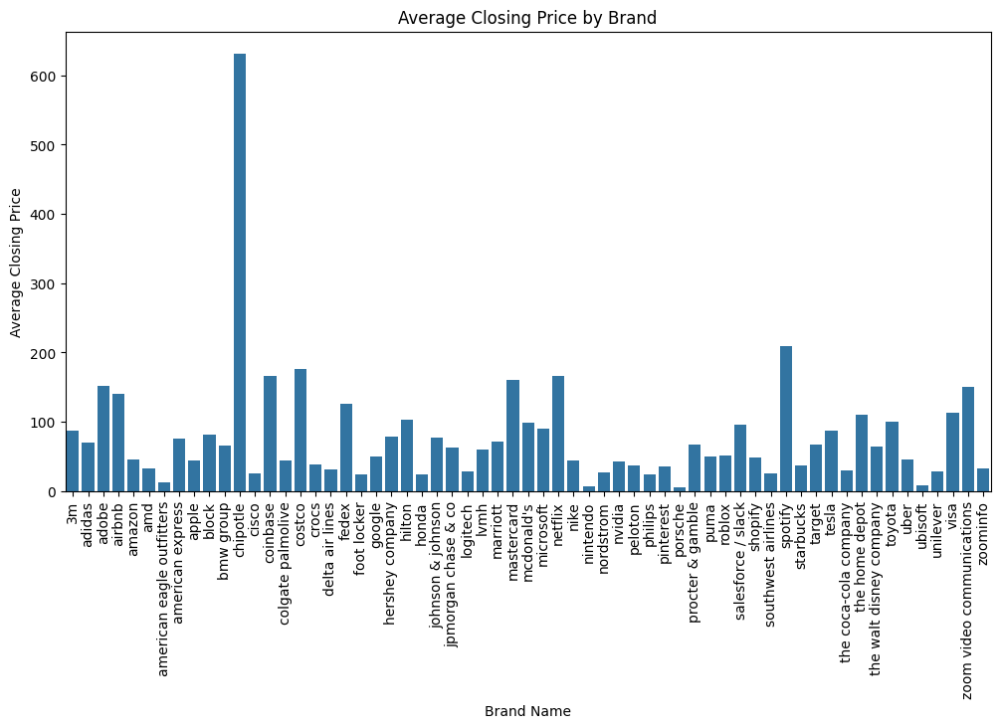

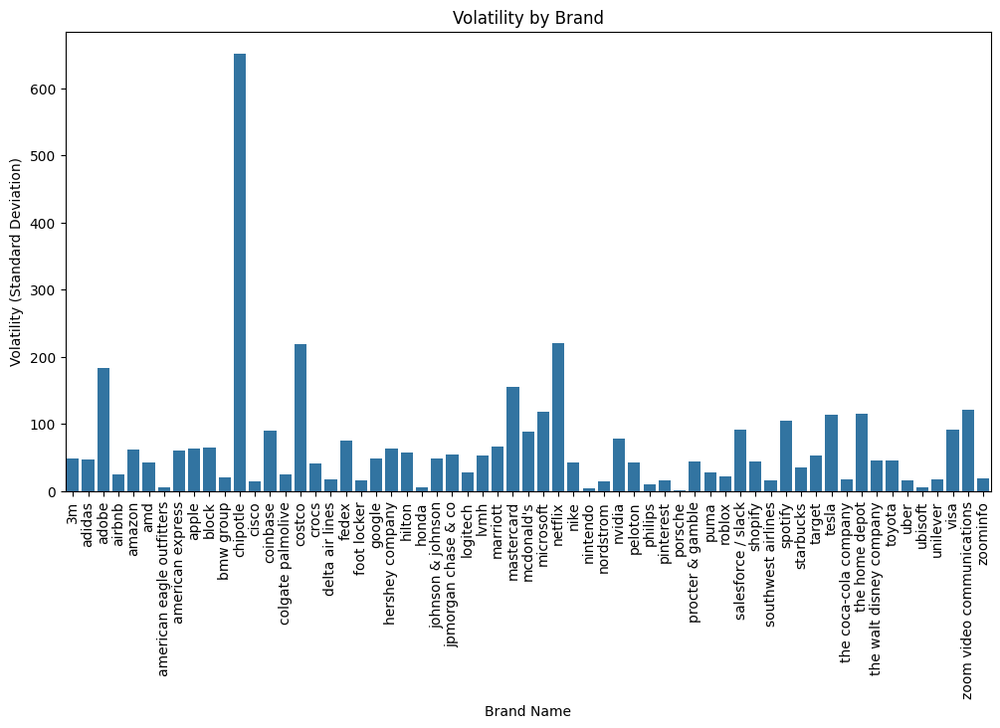

In [ ]:
# Bar chart for average closing price
plt.figure(figsize=(12, 6))
sns.barplot(x='Brand_Name', y='Avg_Close', data=brand_metrics)
plt.xticks(rotation=90)
plt.title('Average Closing Price by Brand')
plt.xlabel('Brand Name')
plt.ylabel('Average Closing Price')
plt.show()

# Bar chart for volatility (standard deviation)
plt.figure(figsize=(12, 6))
sns.barplot(x='Brand_Name', y='Volatility', data=brand_metrics)
plt.xticks(rotation=90)
plt.title('Volatility by Brand')
plt.xlabel('Brand Name')
plt.ylabel('Volatility (Standard Deviation)')
plt.show()

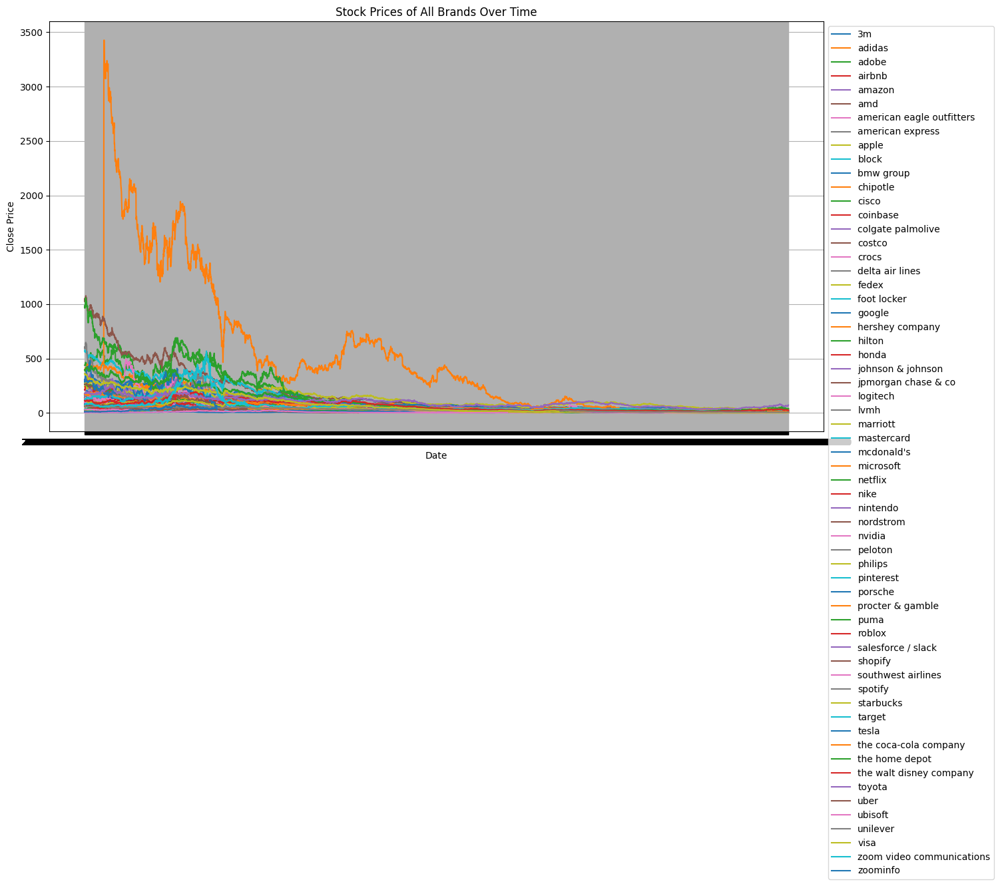

In [ ]:
plt.figure(figsize=(15, 8))

# Loop through each brand and overlay its stock prices on the same chart
for brand, brand_data in grouped_data:
    plt.plot(brand_data['Date'], brand_data['Close'], label=brand)

plt.title('Stock Prices of All Brands Over Time')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))  # Adjust legend position
plt.grid()
plt.show()

<Axes: xlabel='Close'>

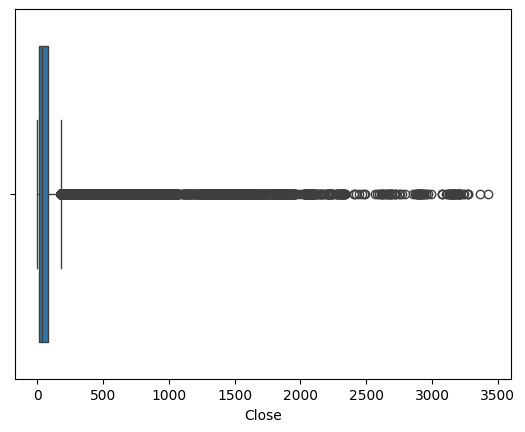

In [ ]:
sns.boxplot(x=data['Close'])

# **IDENTIFYING CORRELATIONS**

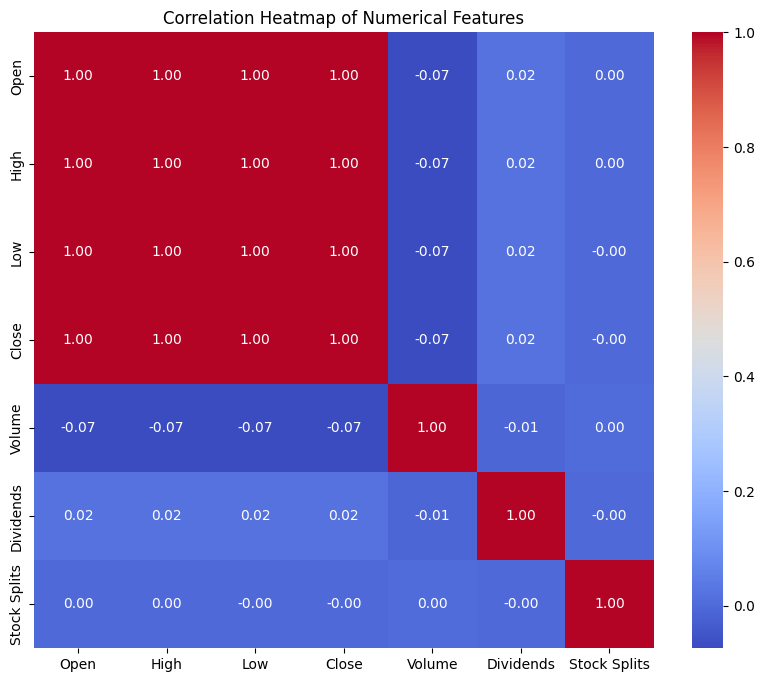

In [ ]:

# Select only numerical columns for correlation analysis
numerical_columns = ['Open', 'High', 'Low', 'Close', 'Volume', 'Dividends', 'Stock Splits']
correlation_matrix = data[numerical_columns].corr()

# Create the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

In [ ]:
# Filter data for adidas brand
adidas_data = data[data['Brand_Name'] == 'adidas']


# Verify filtered data
adidas_data.head()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits,Brand_Name,Ticker,Industry_Tag,Country
2,2025-02-28 00:00:00-05:00,126.589996,128.229996,125.760002,127.589996,34800.0,0.0,0.0,adidas,ADDYY,apparel,germany
96,2025-02-27 00:00:00-05:00,128.089996,128.089996,126.449997,126.699997,24000.0,0.0,0.0,adidas,ADDYY,apparel,germany
133,2025-02-26 00:00:00-05:00,128.779999,130.399994,128.550003,129.100006,27600.0,0.0,0.0,adidas,ADDYY,apparel,germany
227,2025-02-25 00:00:00-05:00,129.429993,130.050003,128.240005,129.419998,28500.0,0.0,0.0,adidas,ADDYY,apparel,germany
245,2025-02-24 00:00:00-05:00,128.869995,129.000000,127.440002,127.449997,40200.0,0.0,0.0,adidas,ADDYY,apparel,germany


In [ ]:
print(adidas_data["Dividends"].unique())

[0.    0.379 0.386 1.821 1.775 1.881 1.615 1.078 0.901 0.794 1.043 0.875
 0.659 0.579 0.241 0.33  0.397 0.286]


In [ ]:
print(adidas_data["Stock Splits"].unique())

[0. 4.]


In [ ]:
# Drop redundant features
adidas_data.drop(columns=['Brand_Name',	'Ticker',	'Industry_Tag',	'Country'], inplace=True)

<ipython-input-25-c904decd1646>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# Drop redundant features
adidas_data.drop(columns=['Date'], inplace=True)

<ipython-input-26-934b4cc52dab>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
adidas_data

,Open,High,Low,Close,Volume,Dividends,Stock Splits
2,126.589996,128.229996,125.760002,127.589996,34800.0,0.0,0.0
96,128.089996,128.089996,126.449997,126.699997,24000.0,0.0,0.0
133,128.779999,130.399994,128.550003,129.100006,27600.0,0.0,0.0
227,129.429993,130.050003,128.240005,129.419998,28500.0,0.0,0.0
245,128.869995,129.000000,127.440002,127.449997,40200.0,0.0,0.0
...,...,...,...,...,...,...,...
247059,19.594389,19.764774,19.303732,19.594389,10400.0,0.0,0.0
247089,20.245869,20.245869,20.245869,20.245869,2000.0,0.0,0.0
247142,20.275932,20.275932,20.245863,20.275932,1600.0,0.0,0.0
247167,19.895071,19.895071,19.895071,19.895071,1600.0,0.0,0.0


# **TECHNICAL INDICATORS**

In [ ]:
# Moving Averages
adidas_data['MA_7_Close'] = adidas_data['Close'].rolling(window=7).mean()
adidas_data['MA_30_Close'] = adidas_data['Close'].rolling(window=30).mean()

# Volatility (Standard Deviation)
adidas_data['Volatility_7'] = adidas_data['Close'].rolling(window=7).std()

# Relative Strength Index (RSI)
def calculate_rsi(data, period=14):
    delta = data.diff()
    gain = delta.where(delta > 0, 0).rolling(window=period).mean()
    loss = -delta.where(delta < 0, 0).rolling(window=period).mean()
    rs = gain / loss
    return 100 - (100 / (1 + rs))

adidas_data['RSI'] = calculate_rsi(adidas_data['Close'])

# Drop rows with NaN values created by rolling or shifting operations
adidas_data.dropna(inplace=True)

<ipython-input-28-4d0ae732db6c>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-28-4d0ae732db6c>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-28-4d0ae732db6c>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-28-4d0ae73

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
columns_to_normalize = ['Open', 'High', 'Low', 'Close', 'Volume', 'Dividends',
                        'Stock Splits',
                        'MA_7_Close', 'MA_30_Close', 'Volatility_7', 'RSI']
adidas_data[columns_to_normalize] = scaler.fit_transform(adidas_data[columns_to_normalize])


<ipython-input-29-815ffc29a54a>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
scaler = MinMaxScaler()
columns_to_normalize = ['Open', 'High', 'Low', 'Close', 'Volume', 'Dividends', 'Stock Splits']
adidas_data[columns_to_normalize] = scaler.fit_transform(adidas_data[columns_to_normalize])

<ipython-input-30-0dd1f5ca9cd4>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
adidas_data

,Open,High,Low,Close,Volume,Dividends,Stock Splits,MA_7_Close,MA_30_Close,Volatility_7,RSI
1864,0.674483,0.676772,0.673159,0.679757,0.016919,0.0,0.0,0.705111,0.702670,0.078492,0.578644
1921,0.686375,0.677863,0.682055,0.674465,0.021776,0.0,0.0,0.707709,0.703990,0.050057,0.617309
1952,0.635050,0.658978,0.635589,0.663172,0.028823,0.0,0.0,0.705674,0.705078,0.059616,0.563210
2055,0.625592,0.621591,0.626251,0.618599,0.007564,0.0,0.0,0.697864,0.704083,0.218366,0.313536
2056,0.626588,0.620663,0.626583,0.618599,0.000582,0.0,0.0,0.690715,0.703025,0.282622,0.353799
...,...,...,...,...,...,...,...,...,...,...,...
247059,0.046443,0.045196,0.047963,0.048723,0.004140,0.0,0.0,0.039470,0.034160,0.041875,0.611055
247089,0.050047,0.047822,0.053168,0.052277,0.000796,0.0,0.0,0.041460,0.034674,0.048294,0.656868
247142,0.050213,0.047986,0.053168,0.052441,0.000637,0.0,0.0,0.043807,0.035209,0.036612,0.677466
247167,0.048106,0.045907,0.051230,0.050363,0.000637,0.0,0.0,0.044844,0.035614,0.032610,0.643423


# **LSTM**

In [ ]:
sequence_length = 60  # Use last 60 days as input sequence

X_seq = []
y_seq = []

for i in range(sequence_length, len(adidas_data)):
    X_seq.append(adidas_data.iloc[i-sequence_length:i].drop(columns=['Close']).values)  # Input features
    y_seq.append(adidas_data.iloc[i]['Close'])  # Target variable

X_seq = np.array(X_seq)
y_seq = np.array(y_seq)

print(f"Shape of X_seq: {X_seq.shape}, Shape of y_seq: {y_seq.shape}")

Shape of X_seq: (4668, 60, 10), Shape of y_seq: (4668,)


# **TRAIN-TEST SPLIT**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_seq, y_seq, test_size=0.2, random_state=42, shuffle=False)
print(f"Training set shape: {X_train.shape}, Testing set shape: {X_test.shape}")

Training set shape: (3734, 60, 10), Testing set shape: (934, 60, 10)


# **BUILDING THE MODEL**

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

model = Sequential([
    LSTM(64, return_sequences=True, input_shape=(X_seq.shape[1], X_seq.shape[2])),
    Dropout(0.2),
    LSTM(64),
    Dropout(0.2),
    Dense(1)  # Output layer for predicting Close price
])

model.compile(optimizer='adam', loss='mse')
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test), verbose=1)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
117/117 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0293 - val_loss: 3.8735e-05
Epoch 2/20
117/117 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.0023 - val_loss: 7.2516e-05
Epoch 3/20
117/117 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.0019 - val_loss: 1.9526e-04
Epoch 4/20
117/117 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.0018 - val_loss: 4.5970e-05
Epoch 5/20
117/117 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.0017 - val_loss: 6.1892e-05
Epoch 6/20
117/117 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.0016 - val_loss: 2.0835e-04
Epoch 7/20
117/117 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.0017 - val_loss: 3.7672e-05
Epoch 8/20
117/117 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.0013 - val_loss: 3.9418e-05
Epoch 9/20
117/117 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.0013 - val_loss: 3.6774e-05
Epoch 10/20
117/117 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - loss: 0.0012 - val_loss: 2.7764e-05
Epoch 11/20
117/117 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step - loss: 0.0013 - val_loss: 4

# **DEFINING THE BEST HYPERPARAMETERS**

In [ ]:
!pip install keras-tuner

In [ ]:
# ✅ Define the Hyperparameter Search Function (Re-run this before the tuner)
def build_model(hp):
    model = Sequential([
        LSTM(hp.Int("lstm_units", min_value=32, max_value=128, step=32), return_sequences=True,
             input_shape=(X_seq.shape[1], X_seq.shape[2])),
        Dropout(hp.Float("dropout_1", min_value=0.1, max_value=0.5, step=0.1)),
        LSTM(hp.Int("lstm_units_2", min_value=32, max_value=128, step=32)),
        Dropout(hp.Float("dropout_2", min_value=0.1, max_value=0.5, step=0.1)),
        Dense(1)  # Output Layer
    ])

    model.compile(
        optimizer=tf.keras.optimizers.Adam(hp.Choice("learning_rate", [0.001, 0.0005, 0.0001])),
        loss="mse"
    )

    return model

In [ ]:
# ✅ Use Keras Tuner to Find Best Hyperparameters
tuner = kt.RandomSearch(
    build_model,
    objective="val_loss",
    max_trials=10,  # Number of different models to test
    executions_per_trial=1,  # Number of times each model is trained
    directory="tuner_results",
    project_name="adidas_stock_prediction"
)

# ✅ Run Hyperparameter Search
tuner.search(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test), verbose=1)

# ✅ Get Best Model
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print(f"✅ Best Hyperparameters: {best_hps.values}")

Trial 10 Complete [00h 02m 30s]
val_loss: 3.4116364986402914e-05

Best val_loss So Far: 2.5730490960995667e-05
Total elapsed time: 00h 27m 02s
✅ Best Hyperparameters: {'lstm_units': 96, 'dropout_1': 0.4, 'lstm_units_2': 128, 'dropout_2': 0.30000000000000004, 'learning_rate': 0.0005}


# **TRAINING THE MODEL**

In [ ]:
# ✅ Train the Best Model
best_model = tuner.hypermodel.build(best_hps)
history = best_model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test), verbose=1)

# ✅ Make Predictions
y_pred = best_model.predict(X_test).flatten()

Epoch 1/20
117/117 ━━━━━━━━━━━━━━━━━━━━ 42s 312ms/step - loss: 0.0209 - val_loss: 8.1289e-05
Epoch 2/20
117/117 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0027 - val_loss: 4.7104e-05
Epoch 3/20
117/117 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0022 - val_loss: 6.6220e-05
Epoch 4/20
117/117 ━━━━━━━━━━━━━━━━━━━━ 22s 165ms/step - loss: 0.0018 - val_loss: 4.1485e-05
Epoch 5/20
117/117 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0016 - val_loss: 4.8002e-05
Epoch 6/20
117/117 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0016 - val_loss: 2.8210e-05
Epoch 7/20
117/117 ━━━━━━━━━━━━━━━━━━━━ 21s 165ms/step - loss: 0.0016 - val_loss: 1.2221e-04
Epoch 8/20
117/117 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.0017 - val_loss: 3.6935e-05
Epoch 9/20
117/117 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0014 - val_loss: 5.9201e-05
Epoch 10/20
117/117 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0018 - val_loss: 2.2974e-05
Epoch 11/20
117/117 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.001

In [ ]:
adidas_data

,Open,High,Low,Close,Volume,Dividends,Stock Splits,MA_7_Close,MA_30_Close,Volatility_7,RSI
1864,0.674483,0.676772,0.673159,0.679757,0.016919,0.0,0.0,0.705111,0.702670,0.078492,0.578644
1921,0.686375,0.677863,0.682055,0.674465,0.021776,0.0,0.0,0.707709,0.703990,0.050057,0.617309
1952,0.635050,0.658978,0.635589,0.663172,0.028823,0.0,0.0,0.705674,0.705078,0.059616,0.563210
2055,0.625592,0.621591,0.626251,0.618599,0.007564,0.0,0.0,0.697864,0.704083,0.218366,0.313536
2056,0.626588,0.620663,0.626583,0.618599,0.000582,0.0,0.0,0.690715,0.703025,0.282622,0.353799
...,...,...,...,...,...,...,...,...,...,...,...
247059,0.046443,0.045196,0.047963,0.048723,0.004140,0.0,0.0,0.039470,0.034160,0.041875,0.611055
247089,0.050047,0.047822,0.053168,0.052277,0.000796,0.0,0.0,0.041460,0.034674,0.048294,0.656868
247142,0.050213,0.047986,0.053168,0.052441,0.000637,0.0,0.0,0.043807,0.035209,0.036612,0.677466
247167,0.048106,0.045907,0.051230,0.050363,0.000637,0.0,0.0,0.044844,0.035614,0.032610,0.643423


In [ ]:
y_pred

array([0.05779342, 0.0571825 , 0.05668234, 0.05566858, 0.05365115,
       0.0508069 , 0.04999274, 0.05152952, 0.05456643, 0.05821168,
       0.05971446, 0.0595521 , 0.05929448, 0.0605735 , 0.06142765,
       0.0634042 , 0.06333428, 0.06394626, 0.06552264, 0.06870526,
       0.07157259, 0.07357056, 0.07341628, 0.07271559, 0.07357534,
       0.07460758, 0.07551751, 0.07565928, 0.07611534, 0.07503237,
       0.07405664, 0.07283914, 0.07188296, 0.07092211, 0.06989802,
       0.06899111, 0.06909332, 0.07002978, 0.06905545, 0.06830436,
       0.06906879, 0.06986576, 0.07035387, 0.07207973, 0.07559518,
       0.07882933, 0.07920273, 0.07868724, 0.07751355, 0.07585824,
       0.075952  , 0.07699523, 0.07694841, 0.07557599, 0.07406328,
       0.07088847, 0.06787211, 0.06441621, 0.06245192, 0.06266302,
       0.06346946, 0.06454697, 0.06521147, 0.06557395, 0.06555859,
       0.06417046, 0.06275339, 0.06123868, 0.05961469, 0.0586523 ,
       0.05702973, 0.05584024, 0.05364721, 0.05301365, 0.05236

In [ ]:
# Create a new column for predictions in adidas_data
adidas_data.loc[adidas_data.index[-len(y_test):], 'Predicted_Close'] = y_pred

# Display the last few rows to verify
print(adidas_data.tail())

            Open      High       Low     Close    Volume  Dividends  \
247059  0.046443  0.045196  0.047963  0.048723  0.004140        0.0   
247089  0.050047  0.047822  0.053168  0.052277  0.000796        0.0   
247142  0.050213  0.047986  0.053168  0.052441  0.000637        0.0   
247167  0.048106  0.045907  0.051230  0.050363  0.000637        0.0   
247227  0.048772  0.046618  0.051895  0.051019  0.011147        0.0   

        Stock Splits  MA_7_Close  MA_30_Close  Volatility_7       RSI  \
247059           0.0    0.039470     0.034160      0.041875  0.611055   
247089           0.0    0.041460     0.034674      0.048294  0.656868   
247142           0.0    0.043807     0.035209      0.036612  0.677466   
247167           0.0    0.044844     0.035614      0.032610  0.643423   
247227           0.0    0.045690     0.035924      0.030265  0.629446   

        Predicted_Close  
247059         0.049790  
247089         0.052970  
247142         0.055664  
247167         0.057626  
2472

<ipython-input-45-867355e51a61>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# **PERFORMANCE EVALUATION**

In [ ]:
# ✅ Evaluate Performance
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
print(f"✅ RMSE: {rmse}")
print(f"✅ MAE: {mae}")

✅ RMSE: 0.005253291772979639
✅ MAE: 0.004101770314911152


In [ ]:
r2 = r2_score(y_test, y_pred)

In [ ]:
r2

0.9534863308634052

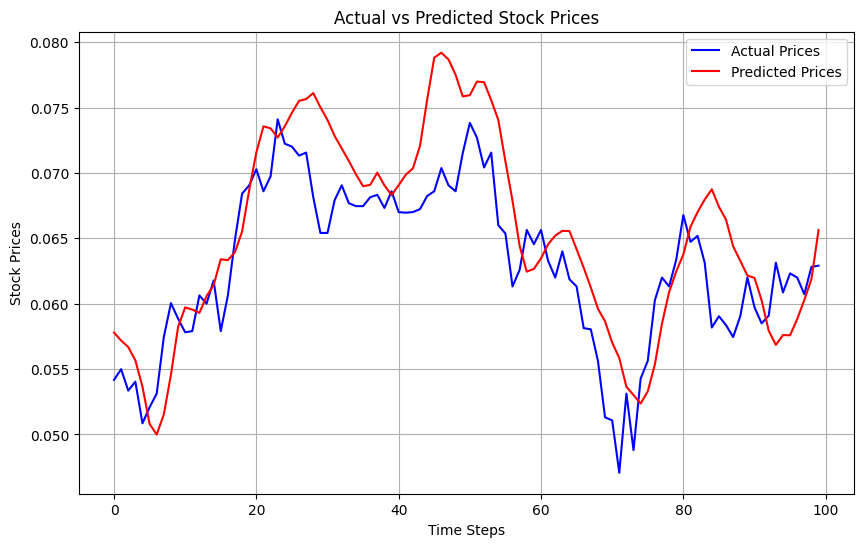

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(y_test[:100], label='Actual Prices', color='blue')
plt.plot(y_pred[:100], label='Predicted Prices', color='red')
plt.title('Actual vs Predicted Stock Prices')
plt.xlabel('Time Steps')
plt.ylabel('Stock Prices')
plt.legend()
plt.grid()
plt.show()

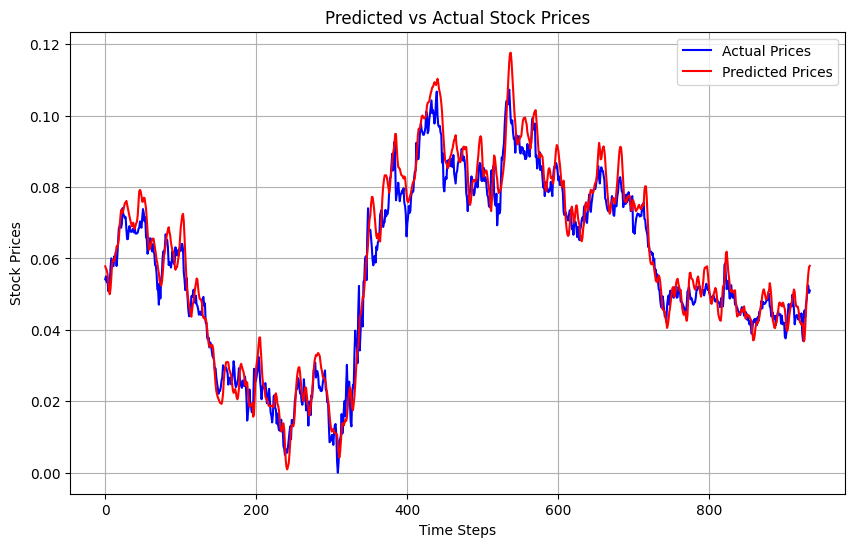

In [ ]:
# Plot actual vs predicted stock prices
plt.figure(figsize=(10, 6))
plt.plot(y_test, label='Actual Prices', color='blue')
plt.plot(y_pred, label='Predicted Prices', color='red')
plt.title('Predicted vs Actual Stock Prices')
plt.xlabel('Time Steps')
plt.ylabel('Stock Prices')
plt.legend()
plt.grid()
plt.show()

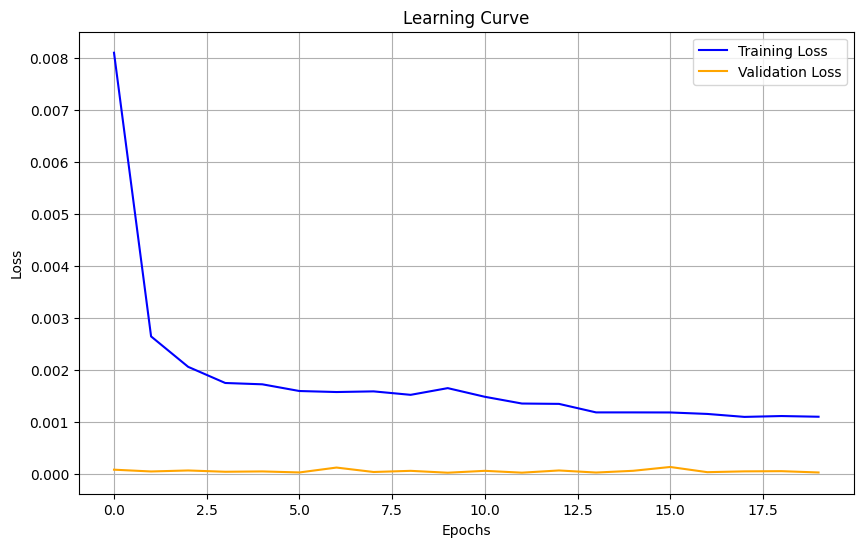

In [ ]:
# Plot learning curves for training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss', color='blue')
plt.plot(history.history['val_loss'], label='Validation Loss', color='orange')
plt.title('Learning Curve')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()

<ipython-input-49-35abfe2c5d5f>:3: FutureWarning:

In a future version of pandas, parsing datetimes with mixed time zones will raise an error unless `utc=True`. Please specify `utc=True` to opt in to the new behaviour and silence this warning. To create a `Series` with mixed offsets and `object` dtype, please use `apply` and `datetime.datetime.strptime`

<ipython-input-49-35abfe2c5d5f>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



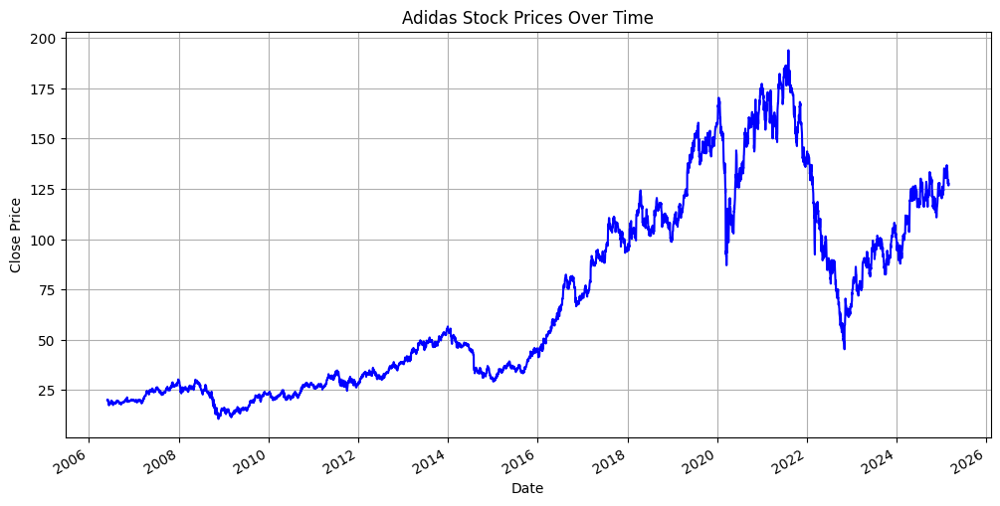

In [ ]:
# Plot stock prices over time for a selected brand (e.g., adidas)
adidas_data = data[data['Brand_Name'] == 'adidas']
adidas_data['Date'] = pd.to_datetime(adidas_data['Date'])

adidas_data.set_index('Date')['Close'].plot(figsize=(12, 6), title="Adidas Stock Prices Over Time", color='blue')
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.grid()

# **SAVING THE MODEL**

In [ ]:
# ✅ Save Model & Predictions
best_model.save("best_adidas_model.h5")
pred_df = pd.DataFrame({"Actual": y_test, "Predicted": y_pred})
pred_df.to_csv("adidas_predictions.csv", index=False)
print("✅ Predictions saved successfully!")

✅ Predictions saved successfully!
